In [1]:
import os, glob, shutil
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns

#from tqdm import tqdm

import skimage
from skimage.io import imread , imsave, imread_collection 

from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, classification_report
from sklearn.preprocessing import LabelEncoder,StandardScaler

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam

In [3]:
# total patients number
img_path ='data_origin/*/'
patient_list = list(glob.glob(img_path))
print(f'Number of the patient: {len(patient_list)}')

Number of the patient: 279


In [4]:
patient_list[0]

'data_origin/10256/'

In [5]:
# total image numbers
sum = 0
for i in range(len(patient_list)):
    sum += len(glob.glob(patient_list[i]+'/*/*'))
print(sum)

277524


In [6]:
img_list=[glob.glob(patient_list[i]+'/*/*') for i in range(len(patient_list))]

In [7]:
len(img_list)

279

In [8]:
img_list[0][0]

'data_origin/10256/0/10256_idx5_x651_y701_class0.png'

In [9]:
t = img_list[0][0].split('/')
t

['data_origin', '10256', '0', '10256_idx5_x651_y701_class0.png']

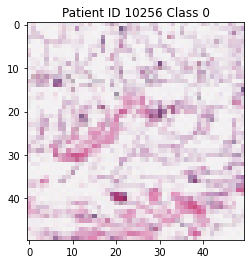

In [10]:
img_sample = imread(img_list[0][0])
plt.title(f'Patient ID {t[1]} Class {t[2]}')
plt.imshow(img_sample)

In [11]:
imgname = img_list[0][0].split('/')[3]
imgname

'10256_idx5_x651_y701_class0.png'

In [12]:
img_sample

array([[[241, 237, 244],
        [236, 217, 226],
        [243, 243, 242],
        ...,
        [225, 211, 225],
        [239, 238, 241],
        [238, 224, 236]],

       [[239, 235, 238],
        [219, 199, 220],
        [244, 239, 244],
        ...,
        [219, 198, 216],
        [217, 199, 212],
        [200, 172, 205]],

       [[239, 234, 241],
        [224, 203, 214],
        [223, 208, 225],
        ...,
        [178, 133, 171],
        [227, 213, 228],
        [234, 230, 238]],

       ...,

       [[230, 204, 220],
        [240, 230, 238],
        [238, 231, 234],
        ...,
        [240, 239, 243],
        [246, 241, 245],
        [246, 237, 242]],

       [[240, 236, 239],
        [237, 219, 230],
        [231, 212, 226],
        ...,
        [246, 241, 243],
        [238, 240, 240],
        [241, 243, 237]],

       [[244, 238, 241],
        [240, 239, 238],
        [239, 210, 225],
        ...,
        [244, 239, 241],
        [245, 242, 246],
        [243, 241, 245]]

In [13]:
img_sample.shape

(50, 50, 3)

In [14]:
img_list[0][:5]

['data_origin/10256/0/10256_idx5_x651_y701_class0.png',
 'data_origin/10256/0/10256_idx5_x2151_y601_class0.png',
 'data_origin/10256/0/10256_idx5_x1151_y851_class0.png',
 'data_origin/10256/0/10256_idx5_x1551_y1301_class0.png',
 'data_origin/10256/0/10256_idx5_x2301_y251_class0.png']

In [16]:
for patient in img_list[:100]:
    for each_img in patient:
        img = imread(each_img)
        p = each_img.split('/')
        if p[2] == '0':
            imsave(os.path.join('0', p[3]), img)
        else:
            imsave(os.path.join('1', p[3]), img)

/home/ubuntu/anaconda3/envs/tensorflow2_latest_p37/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: 1/13694_idx5_x1451_y2351_class1.png is a low contrast image
  
/home/ubuntu/anaconda3/envs/tensorflow2_latest_p37/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: 1/13694_idx5_x1401_y2401_class1.png is a low contrast image
  
/home/ubuntu/anaconda3/envs/tensorflow2_latest_p37/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: 0/13916_idx5_x901_y351_class0.png is a low contrast image
  
/home/ubuntu/anaconda3/envs/tensorflow2_latest_p37/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: 0/13916_idx5_x1601_y401_class0.png is a low contrast image
  
/home/ubuntu/anaconda3/envs/tensorflow2_latest_p37/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: 0/13916_idx5_x1601_y351_class0.png is a low contrast image
  
/home/ubuntu/anaconda3/envs/tensorflow2_latest_p37/lib/python3.7/site-packages/ipykernel_launcher.py:6: 

In [17]:
# total image number for class 0 and 1
nums_0 = len(list(glob.glob('0/*')))
nums_1 = len(list(glob.glob('1/*')))
nums_0, nums_1

(70248, 30853)

In [59]:
30853 / (70248+30853)

0.3051700774473052

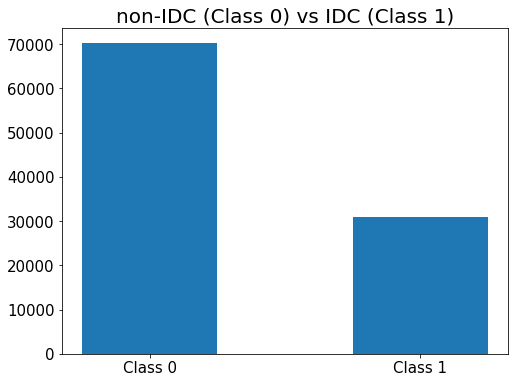

In [20]:
fig, ax = plt.subplots(figsize=(8,6))

ax.bar(['Class 0', 'Class 1'], [nums_0, nums_1], width=0.5)
ax.set_title('non-IDC (Class 0) vs IDC (Class 1)', fontsize=20)
ax.tick_params(labelsize=15)
plt.savefig('images/class.jpg')

Because data classified as IDC (class 1) is approximately 28.9%, this is an unbalanced dataset. However, I have so many images that it's hard to undersample any class. So I will not do anything special to address this imbalance. But I will definately choose F1 score as one of the metrics. 

Now show some examples of Cancerous Patches:

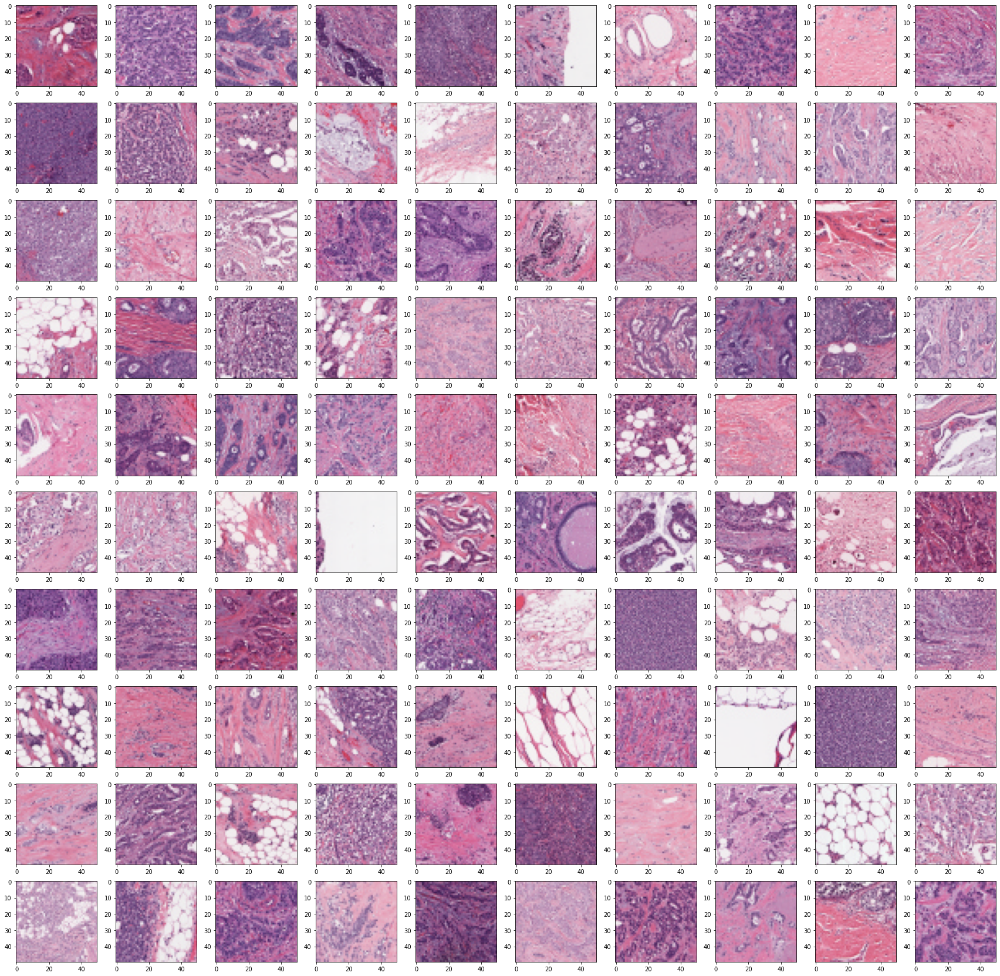

In [21]:
cls1img_list=os.listdir('1')

fig,axs = plt.subplots(10,10,figsize = (30,30))

for i in range(100):
    img = imread('1/'+cls1img_list[i])
    axs.flatten()[i].imshow(img)
plt.savefig('images/class1.jpg')

Now show some examples of Non-Cancerous Patches:

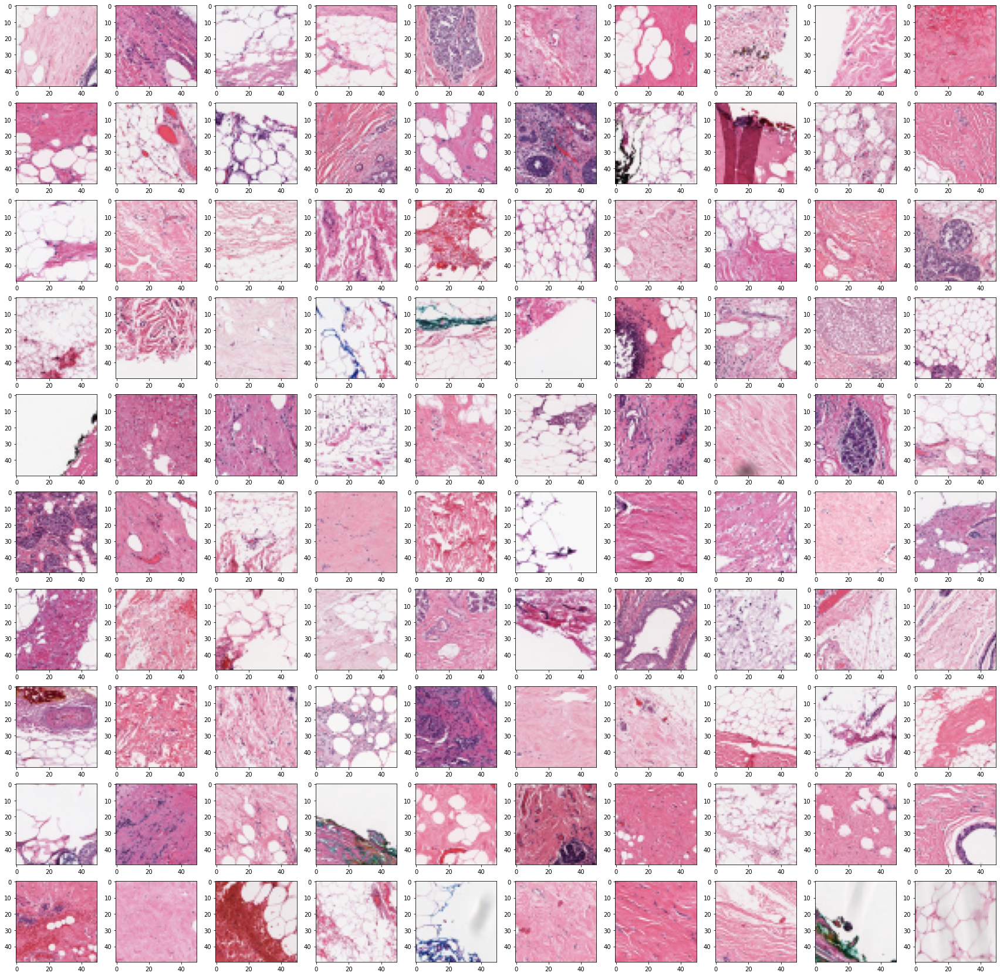

In [22]:
cls0img_list=os.listdir('0')

fig,axs = plt.subplots(10,10,figsize = (30,30))

for i in range(100):
    img = imread('0/'+cls0img_list[i])
    axs.flatten()[i].imshow(img)
plt.savefig('images/class0.jpg')

Above codes moved all images into two big folder '0' and '1', corresponding to Class 0 and Class 1 respectively. Also did some EDA. Now will split data into Train, Validate, Test folders at a ratio of 60% : 20% :20%

In [23]:
# # Creating Train / Val / Test folders
root_dir = 'data'
Cls1 = '/1'
Cls0 = '/0'

os.makedirs(root_dir +'/train' + Cls1)
os.makedirs(root_dir +'/train' + Cls0)
os.makedirs(root_dir +'/val' + Cls1)
os.makedirs(root_dir +'/val' + Cls0)
os.makedirs(root_dir +'/test' + Cls1)
os.makedirs(root_dir +'/test' + Cls0)


In [24]:
# Creating partitions of the data after shuffeling
# First split Class 1 images

Cls1Names = os.listdir(Cls1[1])
np.random.shuffle(Cls1Names)
train_Names, val_Names, test_Names = np.split(np.array(Cls1Names),
                                                          [int(len(Cls1Names)*0.6), int(len(Cls1Names)*0.8)])

train_Names = [name for name in train_Names.tolist()]
val_Names = [name for name in val_Names.tolist()]
test_Names = [name for name in test_Names.tolist()]

print('Total images: ', len(Cls1Names))
print('Training: ', len(train_Names))
print('Validation: ', len(val_Names))
print('Testing: ', len(test_Names))


Total images:  30853
Training:  18511
Validation:  6171
Testing:  6171


In [25]:
# Copy-pasting images
for name in train_Names:
    shutil.copy(Cls1[1]+'/'+name, "data/train"+Cls1)

for name in val_Names:
    shutil.copy(Cls1[1]+'/'+name, "data/val"+Cls1)

for name in test_Names:
    shutil.copy(Cls1[1]+'/'+name, "data/test"+Cls1)


In [26]:
# Then split Class 0 images
Cls0Names = os.listdir(Cls0[1])
np.random.shuffle(Cls0Names)
train_Names, val_Names, test_Names = np.split(np.array(Cls0Names),
                                                          [int(len(Cls0Names)*0.6), int(len(Cls0Names)*0.8)])

train_Names = [name for name in train_Names.tolist()]
val_Names = [name for name in val_Names.tolist()]
test_Names = [name for name in test_Names.tolist()]

print('Total images: ', len(Cls0Names))
print('Training: ', len(train_Names))
print('Validation: ', len(val_Names))
print('Testing: ', len(test_Names))


Total images:  70248
Training:  42148
Validation:  14050
Testing:  14050


In [27]:
# Copy-pasting images
for name in train_Names:
    shutil.copy(Cls0[1]+'/'+name, "data/train"+Cls0)

for name in val_Names:
    shutil.copy(Cls0[1]+'/'+name, "data/val"+Cls0)

for name in test_Names:
    shutil.copy(Cls0[1]+'/'+name, "data/test"+Cls0)

Data augmentation with ImageDataGenerator, and prepare train, validation data.

In [2]:
batch_size = 32

train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    rotation_range=90,
    horizontal_flip=True,
    vertical_flip = True,
    width_shift_range = 0.2,
    height_shift_range = 0.2) 

train_generator = train_datagen.flow_from_directory(
        'data/train',  # this is the target directory
        target_size=(50, 50),  # all images will be resized to 150x150
        batch_size=batch_size,
        seed=1,
        class_mode='binary')

Found 60659 images belonging to 2 classes.


In [10]:
# Store the data in X_train, y_train variables by iterating over the batches
train_generator.reset()
X_train, y_train = next(train_generator)
for i in range(len(train_generator)-1): #1st batch is already fetched before the for loop
    img, label = next(train_generator)
    X_train = np.append(X_train, img, axis=0 )
    y_train = np.append(y_train, label, axis=0)
print(X_train.shape, y_train.shape)

(60659, 50, 50, 3) (60659,)


In [3]:
validation_datagen = ImageDataGenerator(rescale=1./255)

validation_generator = validation_datagen.flow_from_directory(
        'data/val',
        target_size=(50, 50),
        batch_size=batch_size,
        seed=1,
        class_mode='binary')
print(len(validation_generator))


Found 20221 images belonging to 2 classes.
632


In [11]:
# Store the data in X_val, y_val variables by iterating over the batches
validation_generator.reset()
X_val, y_val = next(validation_generator)
for i in range(len(validation_generator)-1): #1st batch is already fetched before the for loop
    img, label = next(validation_generator)
    X_val = np.append(X_val, img, axis=0 )
    y_val = np.append(y_val, label, axis=0)
print(X_val.shape, y_val.shape)

(20221, 50, 50, 3) (20221,)


Build first base CNN model.

In [23]:
def build_model():
    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=(50, 50, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(32, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(64, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
    model.add(Dense(64))
    model.add(Activation('relu'))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.add(Activation('sigmoid'))

    model.compile(loss='binary_crossentropy',
                optimizer='adam',
                metrics=['accuracy', 'AUC', 'Precision', 'Recall'])
    
    return model

base_model = build_model()


In [26]:
#set up early stopping and callbacks to save model during the training process
earlystp_base = EarlyStopping(monitor='loss', patience=5)
filepath = 'models/base_model.h5'
checkpoint_base = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list_base = [checkpoint_base]

history_base = base_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=50,
    callbacks=callbacks_list_base)


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1896 steps, validate for 632 steps
Epoch 1/50
1895/1896 [============================>.] - ETA: 0s - loss: 0.3936 - accuracy: 0.8338 - AUC: 0.8753 - Precision: 0.7683 - Recall: 0.6519
Epoch 00001: loss improved from inf to 0.39388, saving model to models/base_model.h5
1896/1896 [==============================] - 110s 58ms/step - loss: 0.3939 - accuracy: 0.8337 - AUC: 0.8751 - Precision: 0.7682 - Recall: 0.6518 - val_loss: 0.3759 - val_accuracy: 0.8377 - val_AUC: 0.8943 - val_Precision: 0.7782 - val_Recall: 0.6550
Epoch 2/50
1895/1896 [============================>.] - ETA: 0s - loss: 0.3790 - accuracy: 0.8393 - AUC: 0.8861 - Precision: 0.7743 - Recall: 0.6685
Epoch 00002: loss improved from 0.39388 to 0.37908, saving model to models/base_model.h5
1896/1896 [==============================] - 112s 59ms/step - loss: 0.3791 - accuracy: 0.8392 - AUC: 0.8861 - Precision: 0.7740 - Recall: 0.6684 - val_loss: 0.3897 - val_accuracy: 0.8

In [29]:
score = base_model.evaluate(validation_generator, verbose=0)
print('Test score:', score[0])
print('Test accuracy: ', score[1])
print('Test AUC: ', score[2])
print('Test Precision: ', score[3])
print('Test Recall: ', score[4])

  ...
    to  
  ['...']
Test score: 0.3201163361686034
Test accuracy:  0.86345875
Test AUC:  0.9332969
Test Precision:  0.8719459
Test Recall:  0.64770705


In [31]:
base_model.save('models/base_model_complete')

INFO:tensorflow:Assets written to: models/base_model_complete/assets


Notice that if I save to a string without .h5, then it will create a folder and put things in. If I save as string.h5, then it will put everything in a single h5 file. When I need to reload the model later, in the first case, I use load_model('string'), for the second case, I use load_model('string.h5') 

In [32]:
base_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 48, 48, 32)        896       
_________________________________________________________________
activation_5 (Activation)    (None, 48, 48, 32)        0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 24, 24, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 22, 22, 32)        9248      
_________________________________________________________________
activation_6 (Activation)    (None, 22, 22, 32)        0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 9, 9, 64)         

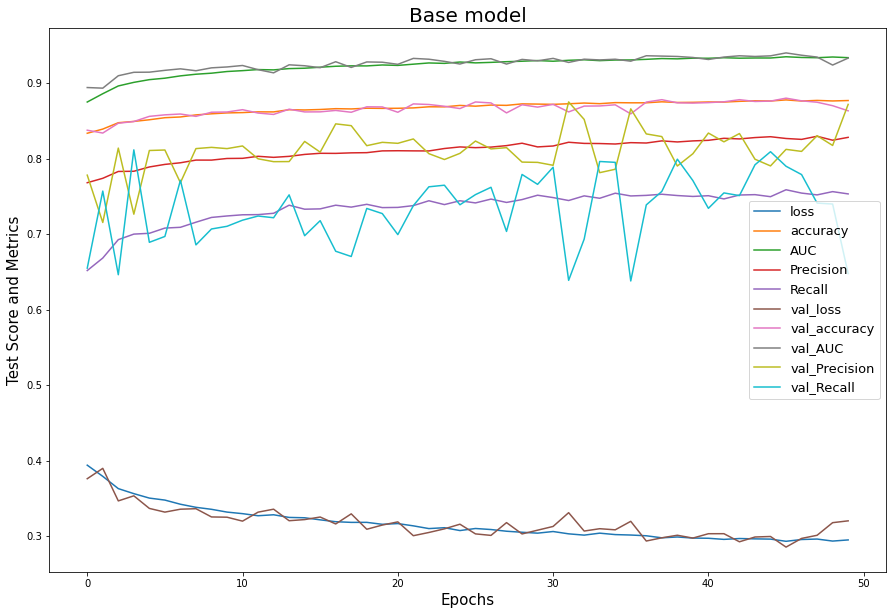

In [33]:
import matplotlib.pyplot as plt 

fig, ax = plt.subplots(figsize=(15,10))
[ax.plot(history_base.history[i], label=i) for i in history_base.history.keys()]
ax.set_xlabel('Epochs', fontsize=15)
ax.set_ylabel('Test Score and Metrics', fontsize=15)
ax.set_title('Base model', fontsize=20)
plt.legend(fontsize=13, loc='best')
plt.savefig('images/base_model.jpg')

The curve is kind of increasing at later epochs, so more epochs will be needed. Anyway, will tune other hyperparameters first.

Say, if I want to continue training from this model, and I am not changing anything in the base model, I only need to load the trained and saved base model, and continue to fit(). If we change anything in the compile stage, we only need to load model, then recompile the model, and continue to fit(). If we changed the model structure, like adding more layers, then we need to start from model building, and the parameters from previously trained model can not be used here. There is another way called model transfering to deal with this though.


In [34]:
from sklearn.metrics import classification_report , confusion_matrix
y_pred = base_model.predict(X_val)
y_pred

array([[3.8197618e-02],
       [8.9392585e-01],
       [2.8430787e-01],
       ...,
       [3.2991454e-02],
       [5.8106020e-14],
       [1.3244535e-02]], dtype=float32)

In [46]:
y_pred_mask = y_pred > 0.5 #np.where(y_pred_class[:,0] > 0.5, 1, y_pred_class)
y_pred_class = y_pred_mask.astype(int)
y_pred_class

array([[0],
       [1],
       [0],
       ...,
       [0],
       [0],
       [0]])

In [47]:
y_pred_class.shape

(20224, 1)

In [48]:
target_name = ['benign','malignant']
classification_report(y_true=y_val , y_pred=y_pred_class, output_dict=True , target_names= target_name)

{'benign': {'precision': 0.8673351330505207,
  'recall': 0.9600170745589073,
  'f1-score': 0.9113257243195786,
  'support': 14056},
 'malignant': {'precision': 0.8795542220317188,
  'recall': 0.6653696498054474,
  'f1-score': 0.7576149160051688,
  'support': 6168},
 'accuracy': 0.8701542721518988,
 'macro avg': {'precision': 0.8734446775411198,
  'recall': 0.8126933621821774,
  'f1-score': 0.8344703201623738,
  'support': 20224},
 'weighted avg': {'precision': 0.8710617618497707,
  'recall': 0.8701542721518988,
  'f1-score': 0.8644463599167265,
  'support': 20224}}

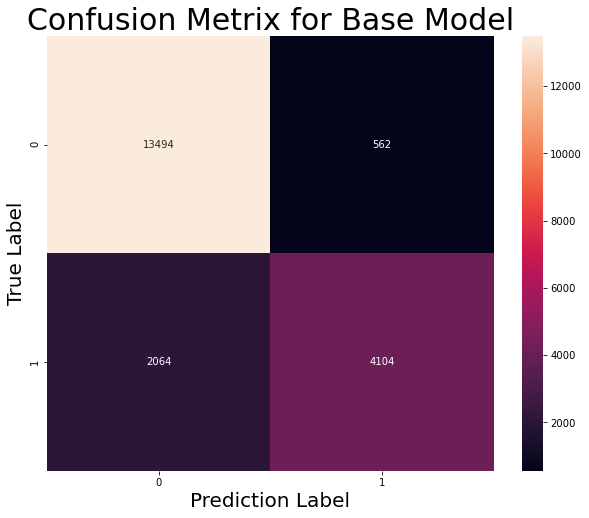

In [49]:
fig, ax = plt.subplots(figsize=(10,8))

sns.heatmap(confusion_matrix(y_true=y_val, y_pred=y_pred_class),annot=True , fmt='2d')
ax.set_title('Confusion Metrix for Base Model',fontsize=30)
ax.set_xlabel('Prediction Label',fontsize=20)
ax.set_ylabel('True Label',fontsize=20)
plt.savefig('images/base_model_confusion.jpg')

Need to recalculate:

TP = 4104, FP = 562, TN = 13494, FN = 2064

Recall = TPR = TP / (TP+FN) = 4104 / (4104+2064)    also know as Sensitivity

Precision = = TP / (TP+FP) = 4104 / (4104+562)     also known as positive prediction value

TNR = TN / (TN+FP) = 13494 / (13494+562)     also known as Specificity


In [34]:
recall = 4104 / (4104+2064)
recall

0.6653696498054474

In [54]:
precision = 4732 / (4732+1260)
precision

0.7897196261682243

In [55]:
specificity = 13760 / (13760+1260) 
specificity

0.9161118508655126

Using softmax for the last output layer

In [53]:
def build_model():
    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=(50, 50, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(32, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(64, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(64, (3, 3))) # add one more CNN layers here
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))
    model.add(Dropout(0.1))
    
    model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
                          # this is necessary before going into conventional dense layer
    
    model.add(Dense(64)) # now start a conventional neural network
    model.add(Activation('relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(1))  #should be equal to the number of classes
    model.add(Activation('softmax'))

    model.compile(loss='binary_crossentropy',
                optimizer='adam',
                metrics=['accuracy', 'AUC', 'Precision', 'Recall'])
    
    return model

soft_model = build_model()

earlystp_soft = EarlyStopping(monitor='loss', patience=3)
filepath = 'models/soft_model.h5'
checkpoint_soft = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list_soft = [checkpoint_soft]

history_soft = soft_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=30,
    callbacks=callbacks_list_soft)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1896 steps, validate for 632 steps
Epoch 1/30
1894/1896 [============================>.] - ETA: 0s - loss: 10.5967 - accuracy: 0.3051 - AUC: 0.5000 - Precision: 0.3051 - Recall: 1.0000
Epoch 00001: loss improved from inf to 10.59571, saving model to models/soft_model.h5
1896/1896 [==============================] - 116s 61ms/step - loss: 10.5958 - accuracy: 0.3052 - AUC: 0.5000 - Precision: 0.3052 - Recall: 1.0000 - val_loss: 10.5953 - val_accuracy: 0.3052 - val_AUC: 0.5000 - val_Precision: 0.3052 - val_Recall: 1.0000
Epoch 2/30
1895/1896 [============================>.] - ETA: 0s - loss: 10.5959 - accuracy: 0.3052 - AUC: 0.5000 - Precision: 0.3052 - Recall: 1.0000
Epoch 00002: loss did not improve from 10.59571
1896/1896 [==============================] - 113s 60ms/step - loss: 10.5958 - accuracy: 0.3052 - AUC: 0.5000 - Precision: 0.3052 - Recall: 1.0000 - val_loss: 10.5953 - val_accuracy: 0.3052 - val_AUC: 0.5000 - val_Precis

In [54]:
score = soft_model.evaluate(validation_generator, verbose=0)
print('Test score:', score[0])
print('Test accuracy: ', score[1])
print('Test AUC: ', score[2])
print('Test Precision: ', score[3])
print('Test Recall: ', score[4])

  ...
    to  
  ['...']
Test score: 10.595263921761815
Test accuracy:  0.30517778
Test AUC:  0.5
Test Precision:  0.30517778
Test Recall:  1.0


With softmax as the activation function for the last output layer. The test accuracy is about 30.5%. If you remember, the percentage of positive cases is about 30.5%. So this model is just like a random guessing. Acutally this makes a lot of sense, becuase I have only two classes, for a binary classification, sigmoid will definitely do a better job than other activation functions at the last output layer. The good thing for sigmoid is that the curve in the middle is very steep. Basically the values are either close to 0 or close to 1. We set the threshold at the middle(0.5), it will separate data points very well, great for a binary classification. Since it's using sigmoid fuction, it is essentially a CNN with logistic regreesion, which can also be used for a large number of classes. Just use sigmoid for all the hidden layers, and set the number inside the last output layer Dense() to the number of classes. One can also use softmax for the last output layer, it is still called logsitical regression since sigmoid function is used for all the hidden layers.

One mistake I made with softmax here is that for the output layer model.add(Dense(1)), I should use Dense(2), because I have two classes. The number inside the Dense() should be the number of classes. Only for sigmoid and binary classification, it should be Dense(1). Will get back to this mistake if I have time.

No, it's not true, I used Dense(2) for softmax, it still raised error. Have to use Dense(1) even it is softmax  for the last layer.


In [55]:
soft_model.save('models/soft_model_complete')

INFO:tensorflow:Assets written to: models/soft_model_complete/assets


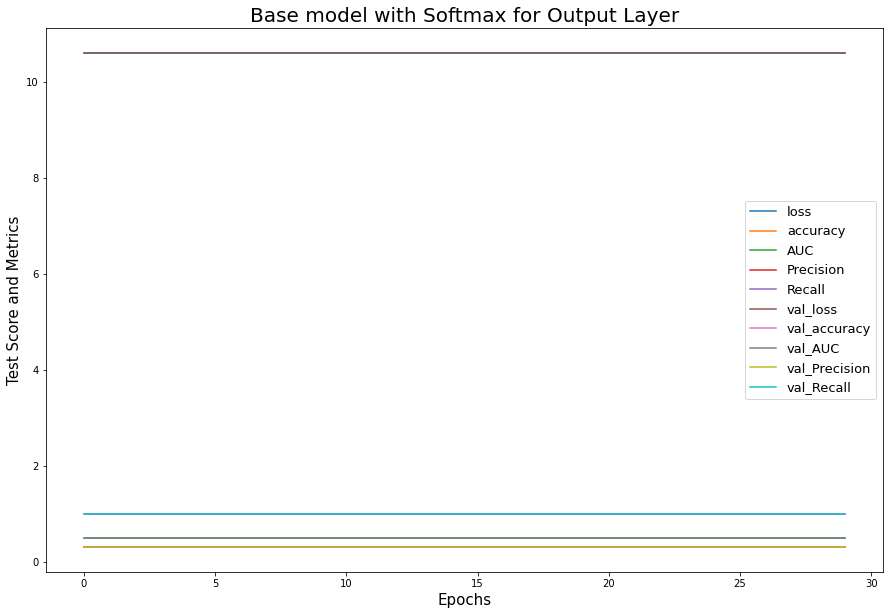

In [56]:
fig, ax = plt.subplots(figsize=(15,10))
[ax.plot(history_soft.history[i], label=i) for i in history_soft.history.keys()]
ax.set_xlabel('Epochs', fontsize=15)
ax.set_ylabel('Test Score and Metrics', fontsize=15)
ax.set_title('Base model with Softmax for Output Layer', fontsize=20)
plt.legend(fontsize=13, loc='best')
plt.savefig('images.base_model_softmax.jpg')

Using SGD as optimizer

In [58]:
def build_model():
    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=(50, 50, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(32, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(64, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
                          # this is necessary before going into conventional dense layer
    
    model.add(Dense(64)) # now start a conventional neural network
    model.add(Activation('relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(1))  #should be equal to the number of classes
    model.add(Activation('sigmoid'))

    model.compile(loss='binary_crossentropy',
                optimizer='sgd',
                metrics=['accuracy', 'AUC', 'Precision', 'Recall'])
    
    return model

sgd_model = build_model()

batch_size = 32

earlystp_sgd = EarlyStopping(monitor='loss', patience=3)
filepath = 'models/sgd_model.h5'
checkpoint_sgd = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list_sgd = [checkpoint_sgd]

history_sgd = sgd_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=30,
    callbacks=callbacks_list_sgd)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1896 steps, validate for 632 steps
Epoch 1/30
1894/1896 [============================>.] - ETA: 0s - loss: 0.5009 - accuracy: 0.7639 - AUC: 0.7849 - Precision: 0.7041 - Recall: 0.3905
Epoch 00001: loss improved from inf to 0.50087, saving model to models/sgd_model.h5
1896/1896 [==============================] - 110s 58ms/step - loss: 0.5009 - accuracy: 0.7640 - AUC: 0.7849 - Precision: 0.7040 - Recall: 0.3908 - val_loss: 0.4626 - val_accuracy: 0.7888 - val_AUC: 0.8514 - val_Precision: 0.7721 - val_Recall: 0.4369
Epoch 2/30
1895/1896 [============================>.] - ETA: 0s - loss: 0.4324 - accuracy: 0.8135 - AUC: 0.8466 - Precision: 0.7206 - Recall: 0.6351
Epoch 00002: loss improved from 0.50087 to 0.43236, saving model to models/sgd_model.h5
1896/1896 [==============================] - 108s 57ms/step - loss: 0.4324 - accuracy: 0.8135 - AUC: 0.8466 - Precision: 0.7206 - Recall: 0.6350 - val_loss: 0.4062 - val_accuracy: 0.824

In [60]:
score = sgd_model.evaluate(validation_generator, verbose=0)
print('Test score:', score[0])
print('Test accuracy: ', score[1])
print('Test AUC: ', score[2])
print('Test Precision: ', score[3])
print('Test Recall: ', score[4])

  ...
    to  
  ['...']
Test score: 0.31212059001709463
Test accuracy:  0.8677118
Test AUC:  0.92695284
Test Precision:  0.8059153
Test Recall:  0.7462324


In [61]:
sgd_model.summary()
sgd_model.save('models/sgd_model_complete')

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_25 (Conv2D)           (None, 48, 48, 32)        896       
_________________________________________________________________
activation_39 (Activation)   (None, 48, 48, 32)        0         
_________________________________________________________________
max_pooling2d_25 (MaxPooling (None, 24, 24, 32)        0         
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 22, 22, 32)        9248      
_________________________________________________________________
activation_40 (Activation)   (None, 22, 22, 32)        0         
_________________________________________________________________
max_pooling2d_26 (MaxPooling (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 9, 9, 64)         

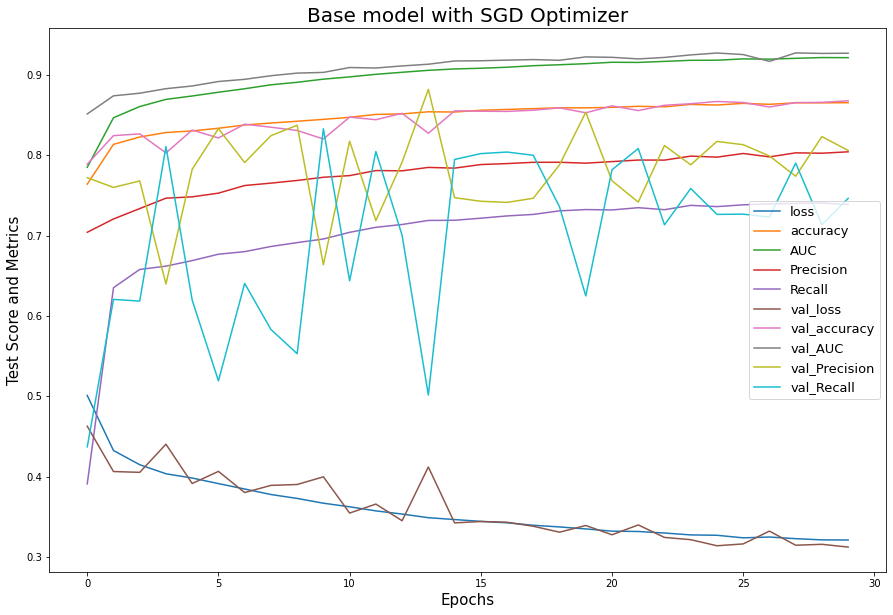

In [62]:
fig, ax = plt.subplots(figsize=(15,10))
[ax.plot(history_sgd.history[i], label=i) for i in history_sgd.history.keys()]
ax.set_xlabel('Epochs', fontsize=15)
ax.set_ylabel('Test Score and Metrics', fontsize=15)
ax.set_title('Base model with SGD Optimizer', fontsize=20)
plt.legend(fontsize=13, loc='best')
plt.savefig('images/sgd.jpg')

Now I will do Batch Normalization:

In [63]:
def build_model():
    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=(50, 50, 3)))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))
    
    model.add(Conv2D(32, (3, 3)))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(64, (3, 3)))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
                          # this is necessary before going into conventional dense layer
    
    model.add(Dense(64)) # now start a conventional neural network
    model.add(Activation('relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(1))  #should be equal to the number of classes
    model.add(Activation('sigmoid'))

    model.compile(loss='binary_crossentropy',
                optimizer='adam',
                metrics=['accuracy', 'AUC', 'Precision', 'Recall'])
    
    return model

batch_norm_model = build_model()

batch_size = 32

earlystp_batch_norm = EarlyStopping(monitor='loss', patience=3)
filepath = 'models/batch_norm_model.h5'
checkpoint_batch_norm = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list_batch_norm = [checkpoint_batch_norm]

history_batch_norm = batch_norm_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=30,
    callbacks=callbacks_list_batch_norm)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1896 steps, validate for 632 steps
Epoch 1/30
1895/1896 [============================>.] - ETA: 0s - loss: 0.3804 - accuracy: 0.8427 - AUC: 0.8874 - Precision: 0.7660 - Recall: 0.6979
Epoch 00001: loss improved from inf to 0.38038, saving model to models/batch_norm_model.h5
1896/1896 [==============================] - 126s 66ms/step - loss: 0.3804 - accuracy: 0.8427 - AUC: 0.8874 - Precision: 0.7660 - Recall: 0.6979 - val_loss: 0.4200 - val_accuracy: 0.8296 - val_AUC: 0.8812 - val_Precision: 0.7310 - val_Recall: 0.6988
Epoch 2/30
1895/1896 [============================>.] - ETA: 0s - loss: 0.3448 - accuracy: 0.8567 - AUC: 0.9085 - Precision: 0.7898 - Recall: 0.7226
Epoch 00002: loss improved from 0.38038 to 0.34480, saving model to models/batch_norm_model.h5
1896/1896 [==============================] - 124s 65ms/step - loss: 0.3449 - accuracy: 0.8567 - AUC: 0.9085 - Precision: 0.7898 - Recall: 0.7225 - val_loss: 0.6002 - val_a

In [64]:
score = batch_norm_model.evaluate(validation_generator, verbose=0)
print('Test score:', score[0])
print('Test accuracy: ', score[1])
print('Test AUC: ', score[2])
print('Test Precision: ', score[3])
print('Test Recall: ', score[4])

  ...
    to  
  ['...']
Test score: 0.3793429881982694
Test accuracy:  0.85589236
Test AUC:  0.9079118
Test Precision:  0.7946445
Test Recall:  0.7117161


In [65]:
batch_norm_model.summary()
batch_norm_model.save('models/batch_norm_model_complete')

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_28 (Conv2D)           (None, 48, 48, 32)        896       
_________________________________________________________________
activation_44 (Activation)   (None, 48, 48, 32)        0         
_________________________________________________________________
batch_normalization (BatchNo (None, 48, 48, 32)        128       
_________________________________________________________________
max_pooling2d_28 (MaxPooling (None, 24, 24, 32)        0         
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 22, 22, 32)        9248      
_________________________________________________________________
activation_45 (Activation)   (None, 22, 22, 32)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 22, 22, 32)       

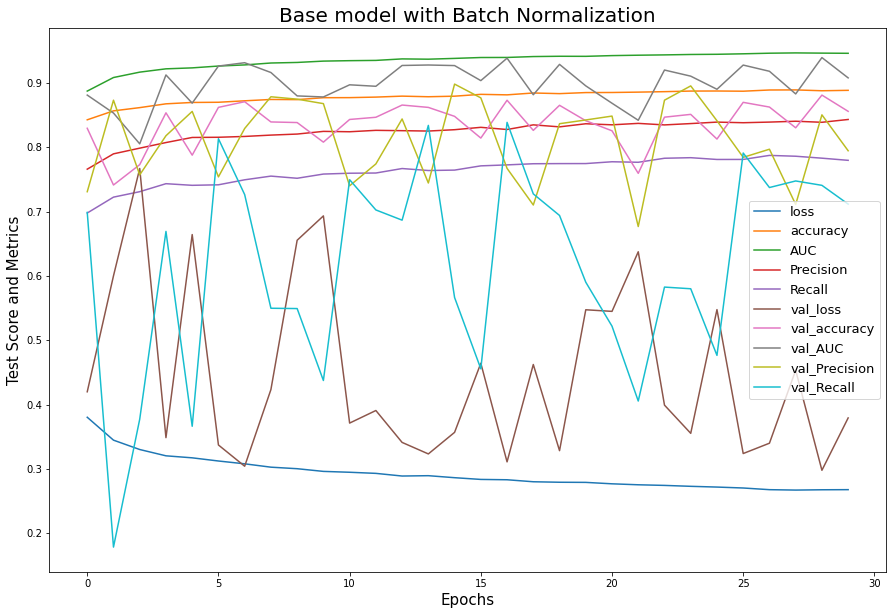

In [67]:
fig, ax = plt.subplots(figsize=(15,10))
[ax.plot(history_batch_norm.history[i], label=i) for i in history_batch_norm.history.keys()]
ax.set_xlabel('Epochs', fontsize=15)
ax.set_ylabel('Test Score and Metrics', fontsize=15)
ax.set_title('Base model with Batch Normalization', fontsize=20)
plt.legend(fontsize=13, loc='best')
plt.savefig('images/batch_norm.jpg')

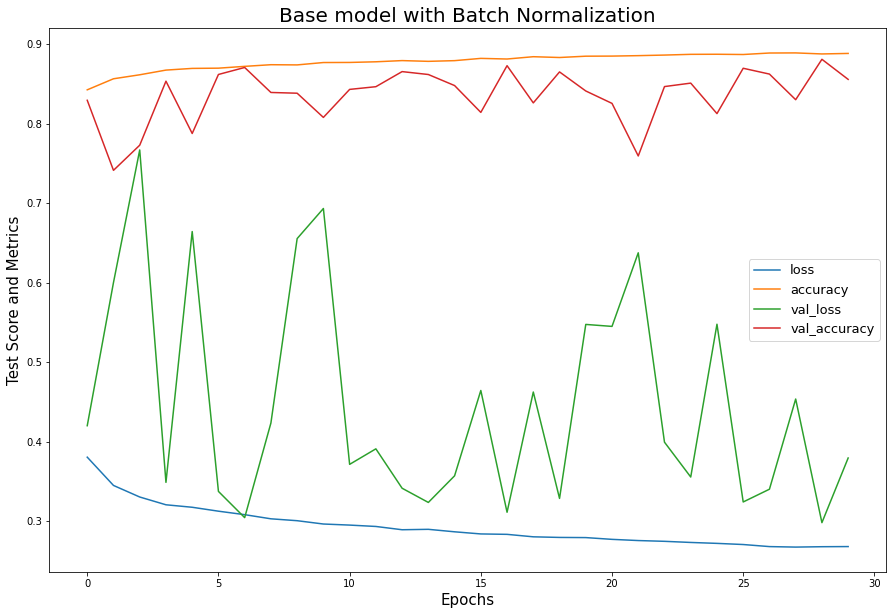

In [68]:
fig, ax = plt.subplots(figsize=(15,10))
[ax.plot(history_batch_norm.history[i], label=i) for i in list(history_batch_norm.history.keys())[:2]]
[ax.plot(history_batch_norm.history[i], label=i) for i in list(history_batch_norm.history.keys())[5:7]]
ax.set_xlabel('Epochs', fontsize=15)
ax.set_ylabel('Test Score and Metrics', fontsize=15)
ax.set_title('Base model with Batch Normalization', fontsize=20)
plt.legend(fontsize=13, loc='best')
plt.savefig('images/batch_norm2.jpg')

L2 regularization

In [74]:
def build_model():

    l2 = keras.regularizers.l2(0.01)
    
    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=(50, 50, 3), kernel_regularizer=l2))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))
    
    model.add(Conv2D(32, (3, 3), kernel_regularizer=l2))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(64, (3, 3), kernel_regularizer=l2))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
                          # this is necessary before going into conventional dense layer
    
    model.add(Dense(64, kernel_regularizer=l2)) # now start a conventional neural network
    model.add(Activation('relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(1))  #should be equal to the number of classes
    model.add(Activation('sigmoid'))

    model.compile(loss='binary_crossentropy',
                optimizer='adam',
                metrics=['accuracy', 'AUC', 'Precision', 'Recall'])
    
    return model

l2_model = build_model()

batch_size = 32

earlystp_l2 = EarlyStopping(monitor='loss', patience=3)
filepath = 'models/l2_model.h5'
checkpoint_l2 = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list_l2 = [checkpoint_l2]

history_l2 = l2_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=30,
    callbacks=callbacks_list_l2)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1896 steps, validate for 632 steps
Epoch 1/30
1894/1896 [============================>.] - ETA: 0s - loss: 0.5275 - accuracy: 0.7976 - AUC: 0.8262 - Precision: 0.7268 - Recall: 0.5390
Epoch 00001: loss improved from inf to 0.52745, saving model to models/l2_model.h5
1896/1896 [==============================] - 113s 60ms/step - loss: 0.5275 - accuracy: 0.7975 - AUC: 0.8262 - Precision: 0.7269 - Recall: 0.5390 - val_loss: 0.4635 - val_accuracy: 0.8149 - val_AUC: 0.8672 - val_Precision: 0.6759 - val_Recall: 0.7563
Epoch 2/30
1895/1896 [============================>.] - ETA: 0s - loss: 0.4548 - accuracy: 0.8182 - AUC: 0.8496 - Precision: 0.7336 - Recall: 0.6350- ETA: 4s - loss: 0.4543 - accuracy: 0
Epoch 00002: loss improved from 0.52745 to 0.45469, saving model to models/l2_model.h5
1896/1896 [==============================] - 111s 59ms/step - loss: 0.4547 - accuracy: 0.8183 - AUC: 0.8497 - Precision: 0.7337 - Recall: 0.6349 - va

In [75]:
score = l2_model.evaluate(validation_generator, verbose=0)
print('Test score:', score[0])
print('Test accuracy: ', score[1])
print('Test AUC: ', score[2])
print('Test Precision: ', score[3])
print('Test Recall: ', score[4])

  ...
    to  
  ['...']
Test score: 0.39127821185260636
Test accuracy:  0.8455566
Test AUC:  0.8979006
Test Precision:  0.7598022
Test Recall:  0.7222492


In [76]:
l2_model.summary()
l2_model.save('models/l2_model_complete')

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_40 (Conv2D)           (None, 48, 48, 32)        896       
_________________________________________________________________
activation_64 (Activation)   (None, 48, 48, 32)        0         
_________________________________________________________________
max_pooling2d_40 (MaxPooling (None, 24, 24, 32)        0         
_________________________________________________________________
conv2d_41 (Conv2D)           (None, 22, 22, 32)        9248      
_________________________________________________________________
activation_65 (Activation)   (None, 22, 22, 32)        0         
_________________________________________________________________
max_pooling2d_41 (MaxPooling (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_42 (Conv2D)           (None, 9, 9, 64)        

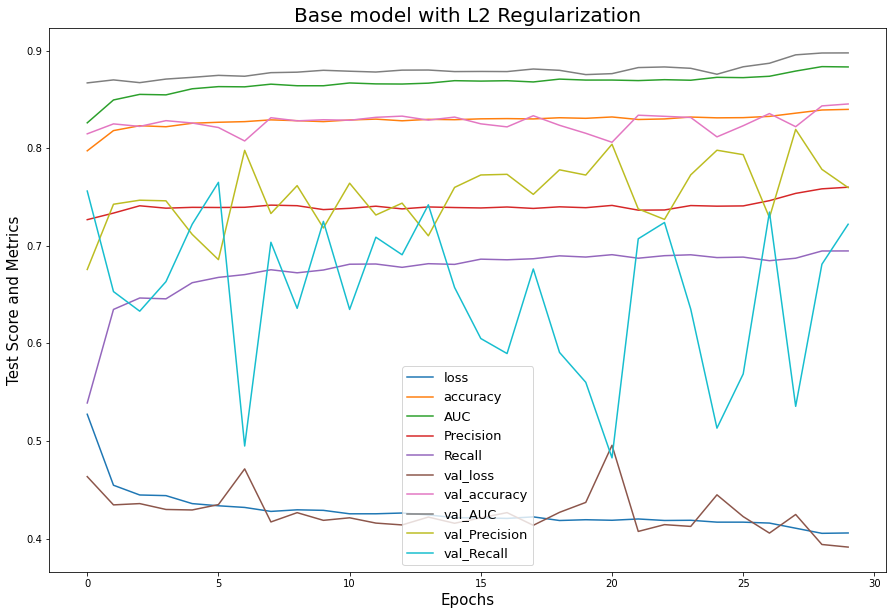

In [77]:
fig, ax = plt.subplots(figsize=(15,10))
[ax.plot(history_l2.history[i], label=i) for i in history_l2.history.keys()]
ax.set_xlabel('Epochs', fontsize=15)
ax.set_ylabel('Test Score and Metrics', fontsize=15)
ax.set_title('Base model with L2 Regularization', fontsize=20)
plt.legend(fontsize=13, loc='best')
plt.savefig('images/l2.jpg')

Try different learning rate for Adam optimizer, the default is 0.001. So will try 0.01, 0.0005 and 0.0001. First try 0.01.

In [21]:
def build_model():

    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=(50, 50, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))
    
    model.add(Conv2D(32, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(64, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
                          # this is necessary before going into conventional dense layer
    
    model.add(Dense(64)) # now start a conventional neural network
    model.add(Activation('relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(1))  #should be equal to the number of classes
    model.add(Activation('sigmoid'))

    model.compile(loss='binary_crossentropy',
                optimizer=Adam(learning_rate=0.01),
                metrics=['accuracy', 'AUC', 'Precision', 'Recall'])
    
    return model


lr01_model = build_model()

earlystp_lr01 = EarlyStopping(monitor='loss', patience=3)
filepath = 'models/lr01_model.h5'
checkpoint_lr01 = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list_lr01 = [checkpoint_lr01]

history_lr01 =lr01_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=30,
    callbacks=callbacks_list_lr01)


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1896 steps, validate for 632 steps
Epoch 1/30
1895/1896 [============================>.] - ETA: 0s - loss: 0.4999 - accuracy: 0.7719 - AUC: 0.7852 - Precision: 0.7015 - Recall: 0.4393
Epoch 00001: loss improved from inf to 0.49991, saving model to models/lr01_model.h5
1896/1896 [==============================] - 111s 58ms/step - loss: 0.4999 - accuracy: 0.7719 - AUC: 0.7852 - Precision: 0.7016 - Recall: 0.4394 - val_loss: 0.4537 - val_accuracy: 0.7956 - val_AUC: 0.8595 - val_Precision: 0.7982 - val_Recall: 0.4417
Epoch 2/30
1895/1896 [============================>.] - ETA: 0s - loss: 0.4373 - accuracy: 0.8128 - AUC: 0.8447 - Precision: 0.7362 - Recall: 0.6022
Epoch 00002: loss improved from 0.49991 to 0.43730, saving model to models/lr01_model.h5
1896/1896 [==============================] - 108s 57ms/step - loss: 0.4373 - accuracy: 0.8127 - AUC: 0.8447 - Precision: 0.7363 - Recall: 0.6020 - val_loss: 0.4842 - val_accuracy: 0.7

In [22]:
lr01_model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 48, 48, 32)        896       
_________________________________________________________________
activation_15 (Activation)   (None, 48, 48, 32)        0         
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 24, 24, 32)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 22, 22, 32)        9248      
_________________________________________________________________
activation_16 (Activation)   (None, 22, 22, 32)        0         
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 9, 9, 64)         

In [23]:
score = lr01_model.evaluate(validation_generator, verbose=0)
print('Test score:', score[0])
print('Test accuracy: ', score[1])
print('Test AUC: ', score[2])
print('Test Precision: ', score[3])
print('Test Recall: ', score[4])

  ...
    to  
  ['...']
Test score: 0.40959892374805257
Test accuracy:  0.8262203
Test AUC:  0.868999
Test Precision:  0.7418533
Test Recall:  0.6603468


In [24]:
lr01_model.save('models/lr01_model_complete')

INFO:tensorflow:Assets written to: models/lr01_model_complete/assets


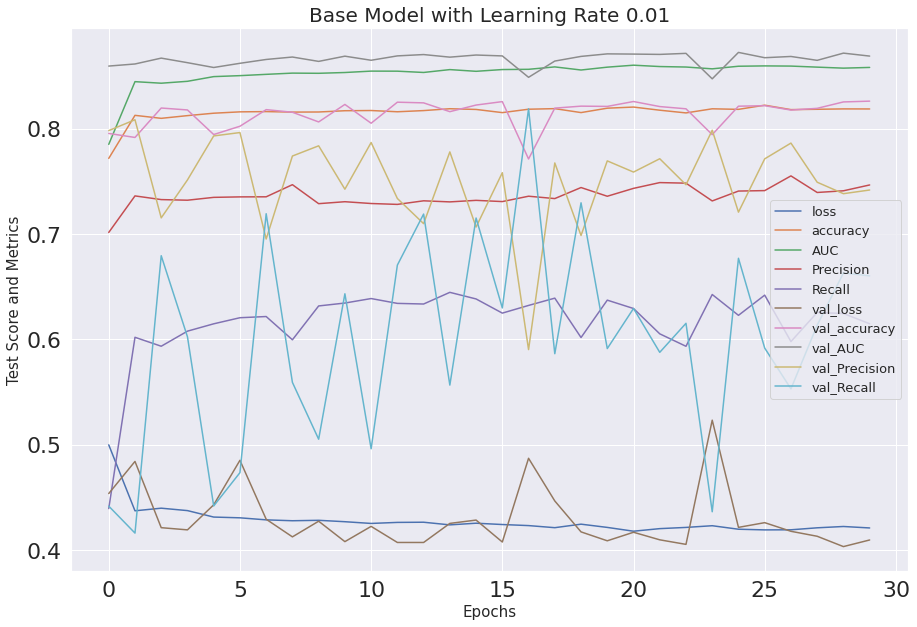

In [26]:
fig, ax = plt.subplots(figsize=(15,10))
[ax.plot(history_lr01.history[i], label=i) for i in history_lr01.history.keys()]
ax.set_xlabel('Epochs', fontsize=15)
ax.set_ylabel('Test Score and Metrics', fontsize=15)
ax.set_title('Base Model with Learning Rate 0.01', fontsize=20)
plt.legend(fontsize=13, loc='best')
plt.savefig('images/lr01.jpg')

Try learning rate 0.0005.

In [33]:
def build_model():

    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=(50, 50, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))
    
    model.add(Conv2D(32, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(64, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
                          # this is necessary before going into conventional dense layer
    
    model.add(Dense(64)) # now start a conventional neural network
    model.add(Activation('relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(1))  #should be equal to the number of classes
    model.add(Activation('sigmoid'))

    model.compile(loss='binary_crossentropy',
                optimizer=Adam(learning_rate=0.0005),
                metrics=['accuracy', 'AUC', 'Precision', 'Recall'])
    
    return model


lr0005_model = build_model()

earlystp_lr0005 = EarlyStopping(monitor='loss', patience=3)
filepath = 'models/lr0005_model.h5'
checkpoint_lr0005 = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list_lr0005 = [checkpoint_lr0005]

history_lr0005 =lr0005_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=30,
    callbacks=callbacks_list_lr0005)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1896 steps, validate for 632 steps
Epoch 1/30
1895/1896 [============================>.] - ETA: 0s - loss: 0.4328 - accuracy: 0.8099 - AUC: 0.8467 - Precision: 0.7470 - Recall: 0.5699
Epoch 00001: loss improved from inf to 0.43282, saving model to models/lr0005_model.h5
1896/1896 [==============================] - 111s 59ms/step - loss: 0.4328 - accuracy: 0.8099 - AUC: 0.8467 - Precision: 0.7470 - Recall: 0.5699 - val_loss: 0.4260 - val_accuracy: 0.8185 - val_AUC: 0.8782 - val_Precision: 0.6755 - val_Recall: 0.7799
Epoch 2/30
1894/1896 [============================>.] - ETA: 0s - loss: 0.3885 - accuracy: 0.8350 - AUC: 0.8785 - Precision: 0.7643 - Recall: 0.6646
Epoch 00002: loss improved from 0.43282 to 0.38856, saving model to models/lr0005_model.h5
1896/1896 [==============================] - 108s 57ms/step - loss: 0.3886 - accuracy: 0.8350 - AUC: 0.8784 - Precision: 0.7639 - Recall: 0.6645 - val_loss: 0.3820 - val_accuracy:

In [35]:
lr0005_model.save('models/lr0005_model_complete')lr0005_model.save('models/lr0005_model_complete')

INFO:tensorflow:Assets written to: models/lr0005_model_complete/assets


In [36]:
score = lr0005_model.evaluate(validation_generator, verbose=0)
print('Test score:', score[0])
print('Test accuracy: ', score[1])
print('Test AUC: ', score[2])
print('Test Precision: ', score[3])
print('Test Recall: ', score[4])

  ...
    to  
  ['...']
Test score: 0.2970140751309787
Test accuracy:  0.8736957
Test AUC:  0.9341822
Test Precision:  0.8230041
Test Recall:  0.7467185


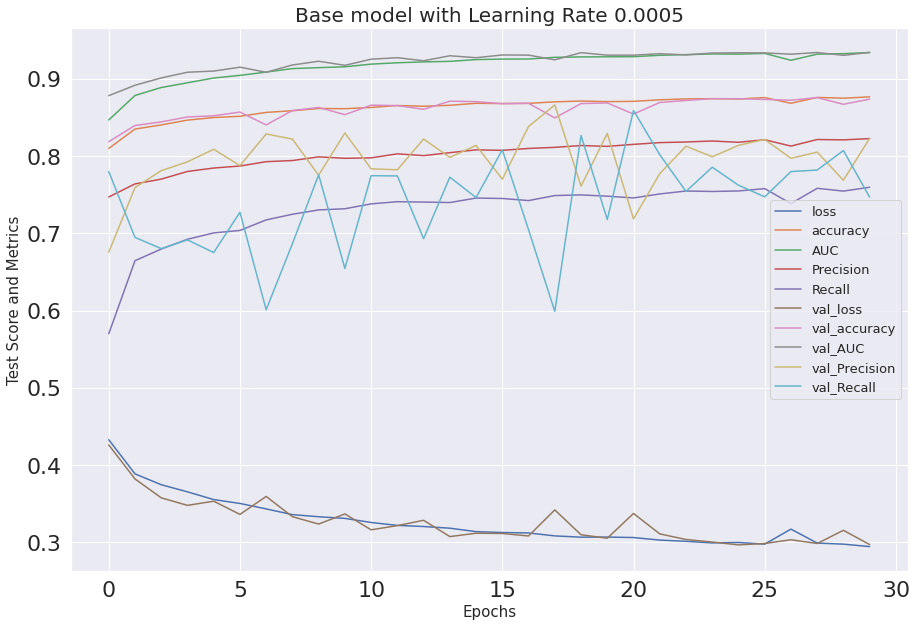

In [38]:
fig, ax = plt.subplots(figsize=(15,10))
[ax.plot(history_lr0005.history[i], label=i) for i in history_lr0005.history.keys()]
ax.set_xlabel('Epochs', fontsize=15)
ax.set_ylabel('Test Score and Metrics', fontsize=15)
ax.set_title('Base model with Learning Rate 0.0005', fontsize=20)
plt.legend(fontsize=13, loc='best')
plt.savefig('images/lr0005.jpg')

Try learning rate 0.0001.

In [ ]:
def build_model():

    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=(50, 50, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))
    
    model.add(Conv2D(32, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(64, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
                          # this is necessary before going into conventional dense layer
    
    model.add(Dense(64)) # now start a conventional neural network
    model.add(Activation('relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(1))  #should be equal to the number of classes
    model.add(Activation('sigmoid'))

    model.compile(loss='binary_crossentropy',
                optimizer=Adam(learning_rate=0.0001),
                metrics=['accuracy', 'AUC', 'Precision', 'Recall'])
    
    return model


lr0001_model = build_model()

earlystp_lr0001 = EarlyStopping(monitor='loss', patience=3)
filepath = 'models/lr0001_model.h5'
checkpoint_lr0001 = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list_lr0001 = [checkpoint_lr0001]

history_lr0001 =lr0001_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=30,
    callbacks=callbacks_list_lr0001)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1896 steps, validate for 632 steps
Epoch 1/30
1895/1896 [============================>.] - ETA: 0s - loss: 0.4388 - accuracy: 0.8035 - AUC: 0.8439 - Precision: 0.7440 - Recall: 0.5426
Epoch 00001: loss improved from inf to 0.43882, saving model to models/lr0001_model.h5
1896/1896 [==============================] - 111s 59ms/step - loss: 0.4388 - accuracy: 0.8035 - AUC: 0.8440 - Precision: 0.7440 - Recall: 0.5427 - val_loss: 0.4070 - val_accuracy: 0.8249 - val_AUC: 0.8731 - val_Precision: 0.7801 - val_Recall: 0.5937
Epoch 2/30
1895/1896 [============================>.] - ETA: 0s - loss: 0.3962 - accuracy: 0.8306 - AUC: 0.8747 - Precision: 0.7523 - Recall: 0.6632
Epoch 00002: loss improved from 0.43882 to 0.39608, saving model to models/lr0001_model.h5
1896/1896 [==============================] - 109s 58ms/step - loss: 0.3961 - accuracy: 0.8307 - AUC: 0.8747 - Precision: 0.7524 - Recall: 0.6633 - val_loss: 0.4441 - val_accuracy:

In [ ]:
lr0001_model.save('models/lr0001_model_complete')

In [ ]:
score = lr0001_model.evaluate(validation_generator, verbose=0)
print('Test score:', score[0])
print('Test accuracy: ', score[1])
print('Test AUC: ', score[2])
print('Test Precision: ', score[3])
print('Test Recall: ', score[4])

In [ ]:
fig, ax = plt.subplots(figsize=(15,10))
[ax.plot(history_lr0001.history[i], label=i) for i in history_lr0001.history.keys()]
ax.set_xlabel('Epochs', fontsize=15)
ax.set_ylabel('Test Score and Metrics', fontsize=15)
ax.set_title('Base model with Learning Rate 0.0001', fontsize=20)
plt.legend(fontsize=13, loc='best')
plt.savefig('images/lr0001.jpg')

Final model with more CNN layers, using SGD optimizer, more epochs

In [4]:
def build_model():
    model = Sequential()
    model.add(Conv2D(64, (3, 3), input_shape=(50, 50, 3)))
    model.add(Conv2D(64, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(64, (3, 3)))
    model.add(Conv2D(64, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(64, (3, 3)))
    model.add(Conv2D(64, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))


    model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
                          # this is necessary before going into conventional dense layer
    
    model.add(Dense(64)) # now start a conventional neural network
    model.add(Activation('relu'))
    model.add(Dropout(0.1))
    
    model.add(Dense(1))  #should be equal to the number of classes
    model.add(Activation('sigmoid'))

    model.compile(loss='binary_crossentropy',
                optimizer='sgd',
                metrics=['accuracy', 'AUC', 'Precision', 'Recall'])
    
    return model

more_model = build_model()

In [5]:
more_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 48, 48, 64)        1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 46, 46, 64)        36928     
_________________________________________________________________
activation (Activation)      (None, 46, 46, 64)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 23, 23, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 21, 21, 64)        36928     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 19, 19, 64)        36928     
_________________________________________________________________
activation_1 (Activation)    (None, 19, 19, 64)        0

In [6]:
earlystp_more = EarlyStopping(monitor='loss', patience=5)
filepath = 'models/more_model.h5'
checkpoint_more = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list_more = [checkpoint_more]

history_more = more_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=100,
    callbacks=callbacks_list_more)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1896 steps, validate for 632 steps
Epoch 1/100
1895/1896 [============================>.] - ETA: 0s - loss: 0.5095 - accuracy: 0.7618 - AUC: 0.7744 - Precision: 0.6797 - Recall: 0.4149
Epoch 00001: loss improved from inf to 0.50933, saving model to models/more_model.h5
1896/1896 [==============================] - 313s 165ms/step - loss: 0.5094 - accuracy: 0.7618 - AUC: 0.7745 - Precision: 0.6798 - Recall: 0.4151 - val_loss: 0.4924 - val_accuracy: 0.7803 - val_AUC: 0.8435 - val_Precision: 0.7628 - val_Recall: 0.4066
Epoch 2/100
1895/1896 [============================>.] - ETA: 0s - loss: 0.4368 - accuracy: 0.8118 - AUC: 0.8423 - Precision: 0.7197 - Recall: 0.6280
Epoch 00002: loss improved from 0.50933 to 0.43679, saving model to models/more_model.h5
1896/1896 [==============================] - 309s 163ms/step - loss: 0.4368 - accuracy: 0.8118 - AUC: 0.8423 - Precision: 0.7197 - Recall: 0.6279 - val_loss: 0.4020 - val_accuracy:

In [7]:
more_model.save('models/more_model_complete')



Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: models/more_model_complete/assets


In [8]:
score = more_model.evaluate(validation_generator, verbose=0)
print('Test score:', score[0])
print('Test accuracy: ', score[1])
print('Test AUC: ', score[2])
print('Test Precision: ', score[3])
print('Test Recall: ', score[4])



  ...
    to  
  ['...']
Test score: 0.2653445518587398
Test accuracy:  0.89041096
Test AUC:  0.9494376
Test Precision:  0.82117915
Test Recall:  0.81931615


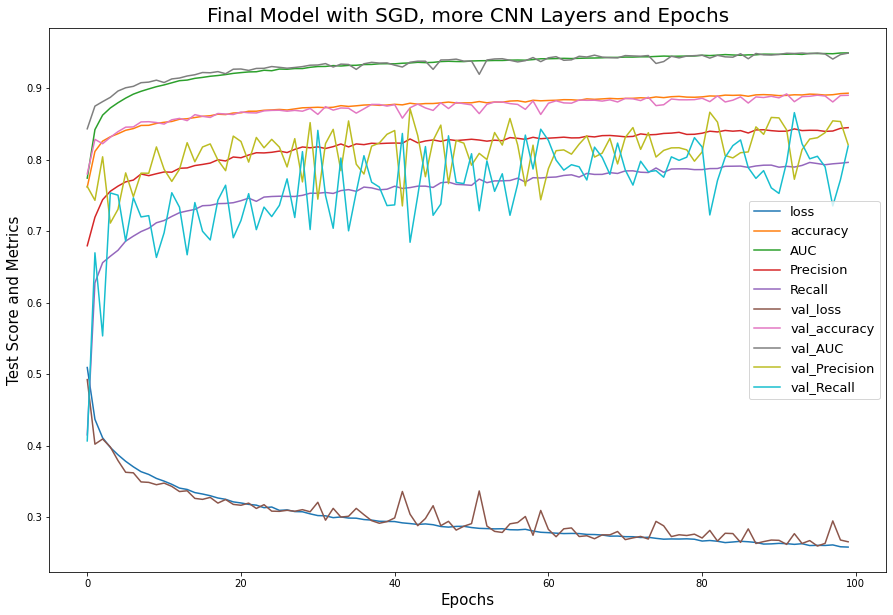

In [9]:
fig, ax = plt.subplots(figsize=(15,10))
[ax.plot(history_more.history[i], label=i) for i in history_more.history.keys()]
ax.set_xlabel('Epochs', fontsize=15)
ax.set_ylabel('Test Score and Metrics', fontsize=15)
ax.set_title('Final Model with SGD, more CNN Layers and Epochs', fontsize=20)
plt.legend(fontsize=13, loc='best')
plt.savefig('images/more.jpg')

In [13]:
y_pred = more_model.predict(X_val)
y_pred

array([[0.00817196],
       [0.00416872],
       [0.9796595 ],
       ...,
       [0.9113628 ],
       [0.00411532],
       [0.98104227]], dtype=float32)

In [14]:
y_pred_mask = y_pred > 0.5
y_pred_class = y_pred_mask.astype(int)
y_pred_class

array([[0],
       [0],
       [1],
       ...,
       [1],
       [0],
       [1]])

In [15]:
target_name = ['benign','malignant']
classification_report(y_true=y_val , y_pred=y_pred_class, output_dict=True , target_names= target_name)

{'benign': {'precision': 0.9207195676905574,
  'recall': 0.9216370106761566,
  'f1-score': 0.9211780607526499,
  'support': 14050},
 'malignant': {'precision': 0.821179145687835,
  'recall': 0.8193161562145519,
  'f1-score': 0.8202465931213498,
  'support': 6171},
 'accuracy': 0.8904109589041096,
 'macro avg': {'precision': 0.8709493566891962,
  'recall': 0.8704765834453543,
  'f1-score': 0.8707123269369998,
  'support': 20221},
 'weighted avg': {'precision': 0.8903420421389625,
  'recall': 0.8904109589041096,
  'f1-score': 0.8903760189766372,
  'support': 20221}}

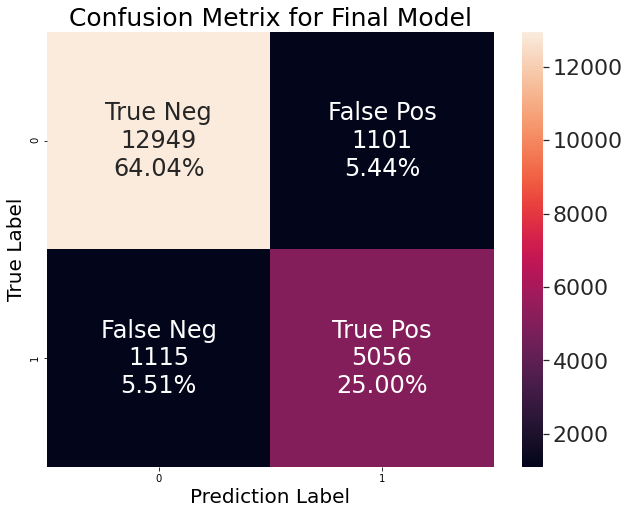

In [17]:
fig, ax = plt.subplots(figsize=(10,8))

group_names = ['True Neg','False Pos','False Neg','True Pos']

cf_matrix = confusion_matrix(y_true=y_val, y_pred=y_pred_class)

group_counts = ['{0:0.0f}'.format(value) for value in
                cf_matrix.flatten()]

group_percentages = ['{0:.2%}'.format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

sns.set(font_scale=2.0)

sns.heatmap(cf_matrix, annot=labels, fmt='')
ax.set_title('Confusion Metrix for Final Model',fontsize=25)
ax.set_xlabel('Prediction Label',fontsize=20)
ax.set_ylabel('True Label',fontsize=20)
plt.savefig('images/final_cf_matrix.jpg')

AUC: 0.9495577465714676


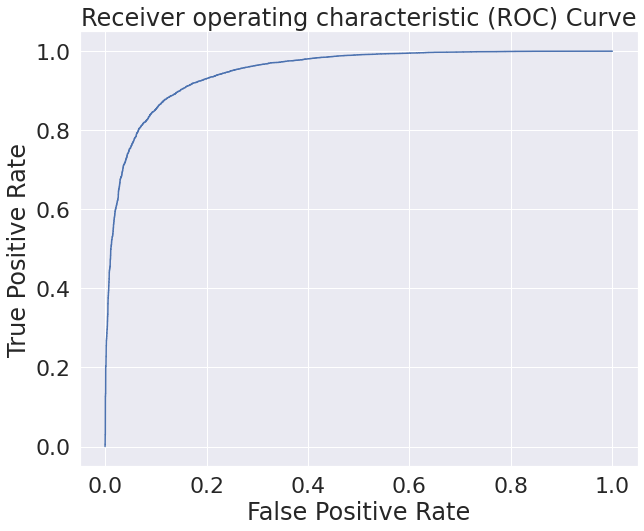

In [18]:
fig, ax = plt.subplots(figsize=(10,8))

fpr, tpr, thresholds = roc_curve(y_val, y_pred, pos_label=0)

# Print ROC curve
plt.plot(1-fpr,1-tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.savefig('images/roc.jpg')

# Print AUC
auc = np.trapz(tpr,fpr)
print('AUC:', 1-auc)

Try out on holdout dataset

In [27]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = validation_datagen.flow_from_directory(
        'data/test',
        target_size=(50, 50),
        batch_size=batch_size,
        seed=1,
        class_mode='binary')
print(len(test_generator))

Found 20221 images belonging to 2 classes.
632


In [28]:
# Store the data in X_test, y_test variables by iterating over the batches
test_generator.reset()
X_test, y_test = next(test_generator)
for i in range(len(test_generator)-1): #1st batch is already fetched before the for loop
    img, label = next(test_generator)
    X_test = np.append(X_test, img, axis=0 )
    y_test = np.append(y_test, label, axis=0)
print(X_test.shape, y_test.shape)

(20221, 50, 50, 3) (20221,)


In [7]:
more3_model = load_model("models/more2_model_complete")

In [29]:
score = more_model.evaluate(test_generator, verbose=0)
print('Test score:', score[0])
print('Test accuracy: ', score[1])
print('Test AUC: ', score[2])
print('Test Precision: ', score[3])
print('Test Recall: ', score[4])

  ...
    to  
  ['...']
Test score: 0.26054307955753386
Test accuracy:  0.8953069
Test AUC:  0.9502421
Test Precision:  0.83262223
Test Recall:  0.822233


In [30]:
y_test_pred = more_model.predict(X_test)
y_test_pred

array([[2.5483733e-02],
       [5.1510972e-01],
       [1.2073301e-02],
       ...,
       [6.7409998e-01],
       [1.8594356e-03],
       [4.0395439e-04]], dtype=float32)

In [31]:
y_test_pred_mask = y_test_pred > 0.5
y_test_pred_class = y_test_pred_mask.astype(int)
y_test_pred_class

array([[0],
       [1],
       [0],
       ...,
       [1],
       [0],
       [0]])

In [32]:
target_name = ['benign','malignant']
classification_report(y_true=y_test , y_pred=y_test_pred_class, output_dict=True , target_names= target_name)

{'benign': {'precision': 0.9223472782614851,
  'recall': 0.9274021352313168,
  'f1-score': 0.924867799978706,
  'support': 14050},
 'malignant': {'precision': 0.8326222513948146,
  'recall': 0.8222330254415816,
  'f1-score': 0.8273950264981655,
  'support': 6171},
 'accuracy': 0.8953068592057761,
 'macro avg': {'precision': 0.8774847648281499,
  'recall': 0.8748175803364492,
  'f1-score': 0.8761314132384358,
  'support': 20221},
 'weighted avg': {'precision': 0.8949651932610289,
  'recall': 0.8953068592057761,
  'f1-score': 0.8951212748242421,
  'support': 20221}}

In [69]:
from keras import backend as K

from keras.optimizers import SGD
from keras.optimizers import Adam

from hyperopt import Trials, STATUS_OK, tpe
from hyperas import optim
from hyperas.distributions import choice, uniform

In [87]:
def model(train_generator, validation_generator):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=(50, 50, 3)))
    model.add(Activation({{choice(['relu', 'sigmoid'])}}))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(32, (3, 3)))
    model.add(Activation({{choice(['relu', 'sigmoid'])}}))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Conv2D(64, (3, 3)))
    model.add(Activation({{choice(['relu', 'sigmoid'])}}))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=(2,2), padding='valid'))

    model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
    model.add(Dense(64))
    model.add(Activation({{choice(['relu', 'sigmoid'])}}))
    model.add(Dropout({choice([0.05, 0.1, 0.2, 0.3])}))
    model.add(Dense(1))
    model.add(Activation({{choice(['relu', 'sigmoid', 'softmax'])}}))

    adam = keras.optimizers.Adam(lr={{choice([10**-3, 10**-2, 10**-1])}})
    rmsprop = keras.optimizers.RMSprop(lr={{choice([10**-3, 10**-2, 10**-1])}})
    sgd = keras.optimizers.SGD(lr={{choice([10**-3, 10**-2, 10**-1])}})
   
    choiceval = {{choice(['adam', 'sgd', 'rmsprop'])}}
    if choiceval == 'adam':
        optim = adam
    elif choiceval == 'rmsprop':
        optim = rmsprop
    else:
        optim = sgd
        
    model.compile(loss='binary_crossentropy',
                optimizer=optim,
                metrics=['accuracy'])

    model.fit(train_generator, epochs=epochs, validation_data=validation_generator)
    score, acc = model.evaluate(generator=validation_generator)
    
    print('Test accuracy:', acc)
    return {'loss': -acc, 'status': STATUS_OK, 'model': model}

def data(): 
    train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        rotation_range=90,
        horizontal_flip=True,
        vertical_flip = True,
        width_shift_range = 0.2,
        height_shift_range = 0.2) 

    train_generator = train_datagen.flow_from_directory(
            'data/train',  # this is the target directory
            target_size=(50, 50),  # all images will be resized to 150x150
            batch_size=batch_size,
            seed=1,
            class_mode='binary')

    validation_datagen = ImageDataGenerator(rescale=1./255)

    validation_generator = validation_datagen.flow_from_directory(
            'data/val',
            target_size=(50, 50),
            batch_size=batch_size,
            seed=1,
            class_mode='binary')

    return train_generator, validation_generator

epochs=20
batch_size=16

train_generator, validation_generator = data()

best_run, best_model = optim.minimize(
    model=model(train_generator, validation_generator), data=data,
                algo=tpe.suggest, max_evals=10, trials=Trials(), notebook_name='cap2')

print('Evaluation of best performing model:')

print(best_model.evaluate(validation_generator))

Found 63876 images belonging to 2 classes.
Found 21293 images belonging to 2 classes.


TypeError: require string label